# <center>DOTA2COCO pipeline</center>
## 用于对DOTA数据集进行切分、整理、并转化为COCO的json数据


# DOTA 目标类别

In [1]:

class_list = ['plane', 'baseball-diamond', 'bridge', 'ground-track-field', 'small-vehicle',
                  'large-vehicle', 'ship', 'tennis-court', 'basketball-court',  'storage-tank', 'soccer-ball-field', 
                  'roundabout', 'harbor', 'swimming-pool', 'helicopter']


# STEP 0：加载依赖库，设置全局参数，创建DOTA类

In [2]:
%matplotlib inline
import numpy as np
import matplotlib.pyplot as plt
import os
from DOTA import DOTA # DOTA类
import dota_utils as util # 各种函数


# 设置DOTA数据集的路径，model in ['train','val','test']
dota_path = '/home/liuchang/data/DOTA/'
model = 'val'

In [3]:
import pylab # 画图用的
pylab.rcParams['figure.figsize'] = (30.0, 30.0)
!echo 我在想这个地方重复运行就会导致失效？

我在想这个地方重复运行就会导致失效？


## 实例化DOTA类

In [4]:
dataset = DOTA(dota_path + model)

# STEP 1：按目标类别筛选图片id
## (1) DOTA.getImgIds：获取特定类别的图片ID
返回一个“同时”包含 catNms 列表中“所有类别”的图片名字符串组成的 list
## (2) DOTA.loadImgs(imgid)：获取ID对应的图片
imgid 是一个 list

返回也是 list 其中每个元素是一个图片（numpy.array）

In [5]:
imgids = dataset.getImgIds(catNms=['ship', 'storage-tank'])
print('符合条件的图片共'+ str(len(imgids)) + '个!')
imgid = imgids[0]
img = dataset.loadImgs(imgid)[0]
# imgs = dataset.loadImgs(imgids)

符合条件的图片共13个!
isarralike: False
imgids: ['P2701']
filename: /home/liuchang/data/DOTA/val/images/P2701.png


让我们康康这十三个图片里第一个的发育正不正常啊

In [ ]:
plt.axis('off')
plt.imshow(img)
plt.show()

## 显示标注
1. DOTA.loadAnns(imgId)
1. DOTA.showAnns(anns,imgid,2)

{'name': 'ship', 'difficult': '1', 'poly': [(2245.0, 2014.0), (2247.0, 2011.0), (2256.0, 2016.0), (2255.0, 2019.0)], 'area': 36.0}
isarralike: False
imgids: ['P2286']
filename: /home/liuchang/data/DOTA/val/images/P2286.png


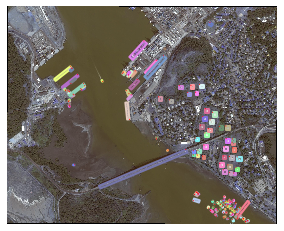

In [6]:
anns = dataset.loadAnns(imgId=imgid)
print(anns[0])
dataset.showAnns(anns, imgid, 2)

# STEP2 分割图片与标注
在分割图片与数据之前提供了一个缩放参数。
有的时候物体实在太大，很容易就被切没了，这个时候 “rate” 参数就要小于1了。


搞测试图像的时候只需要切图（因为没标注），用 "SplitOnlyImage.py"

In [6]:
# from ImgSplit import splitbase # 正常的分割
from ImgSplit_multi_process import splitbase # 没有感情的多线程分割器

data_path = '/home/liuchang/data'

'''
指定分割后数据集的存放位置
'''
split_path = os.path.join(data_path,'DOTAsplit')
split_img_root = os.path.join(split_path,'images')
split_label_root = os.path.join(split_path,'labelTxt')

'''
构造存放路径
'''
if not os.path.exists(split_path):
    os.mkdir(split_path)
print('切分数据地址为：', split_path)
if not os.path.exists(split_img_root):
    os.mkdir(split_img_root)
print('切分后图片地址为：', split_img_root)
if not os.path.exists(split_label_root):
    os.mkdir(split_label_root)
print('切分后图片地址为：', split_label_root)    

切分数据地址为： /home/liuchang/data/DOTAsplit
切分后图片地址为： /home/liuchang/data/DOTAsplit/images
切分后图片地址为： /home/liuchang/data/DOTAsplit/labelTxt


## 分割开始

- **TODO : 在splitbase中加入imgids参数**

In [8]:
import time
tic = time.time()
split = splitbase(dota_path + model,  # 元数据位置
                 split_path,          # 目标位置
                 choosebestpoint=True,# 选择最佳分割点（？
                 gap=100,             # 步长
                 subsize=512,        # 切割后图片大小subsize*subsize
                 num_process=8)       # 多核
split.splitdata(1)
print('分割耗时', time.time()-tic)
# split.splitdata(1,imgids)
# split.splitdata(2,imgids)

padding: True
分割耗时 231.83153200149536


## 分割后的数据集
### 实例化，康一康

isarralike: False
imgids: ['P0019__1__5356___3215']
filename: /home/liuchang/data/DOTAsplit/images/P0019__1__5356___3215.png


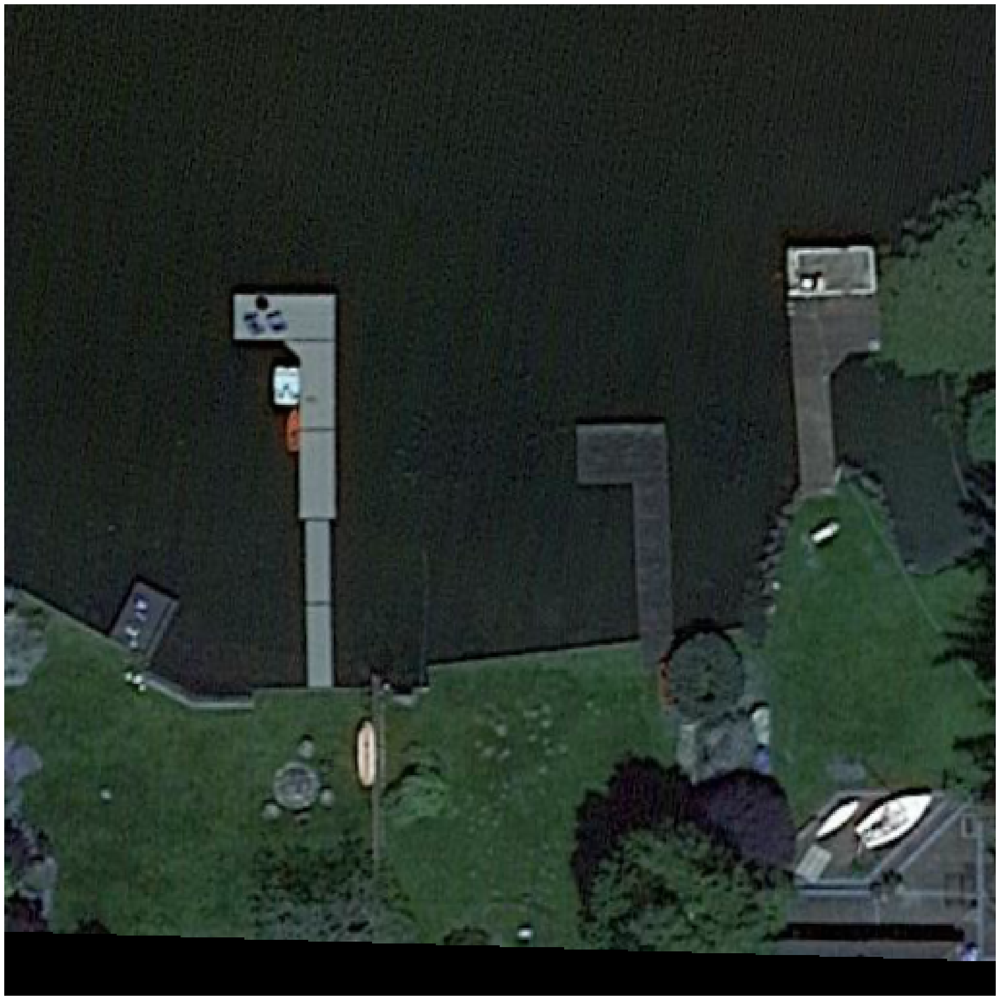

In [7]:
DotaSplit = DOTA(split_path)
imgids = DotaSplit.getImgIds(catNms=['ship'])
imgid = imgids[1]
img = DotaSplit.loadImgs(imgid)[0]

plt.axis('off')
plt.imshow(img)
plt.show()

In [8]:
'''事实告诉我们，这图像的确被切的不错233'''
print(type(img),img.shape)


<class 'numpy.ndarray'> (512, 512, 3)


isarralike: False
imgids: ['P0858__1__1236___824']
filename: /home/liuchang/data/DOTAsplit/images/P0858__1__1236___824.png


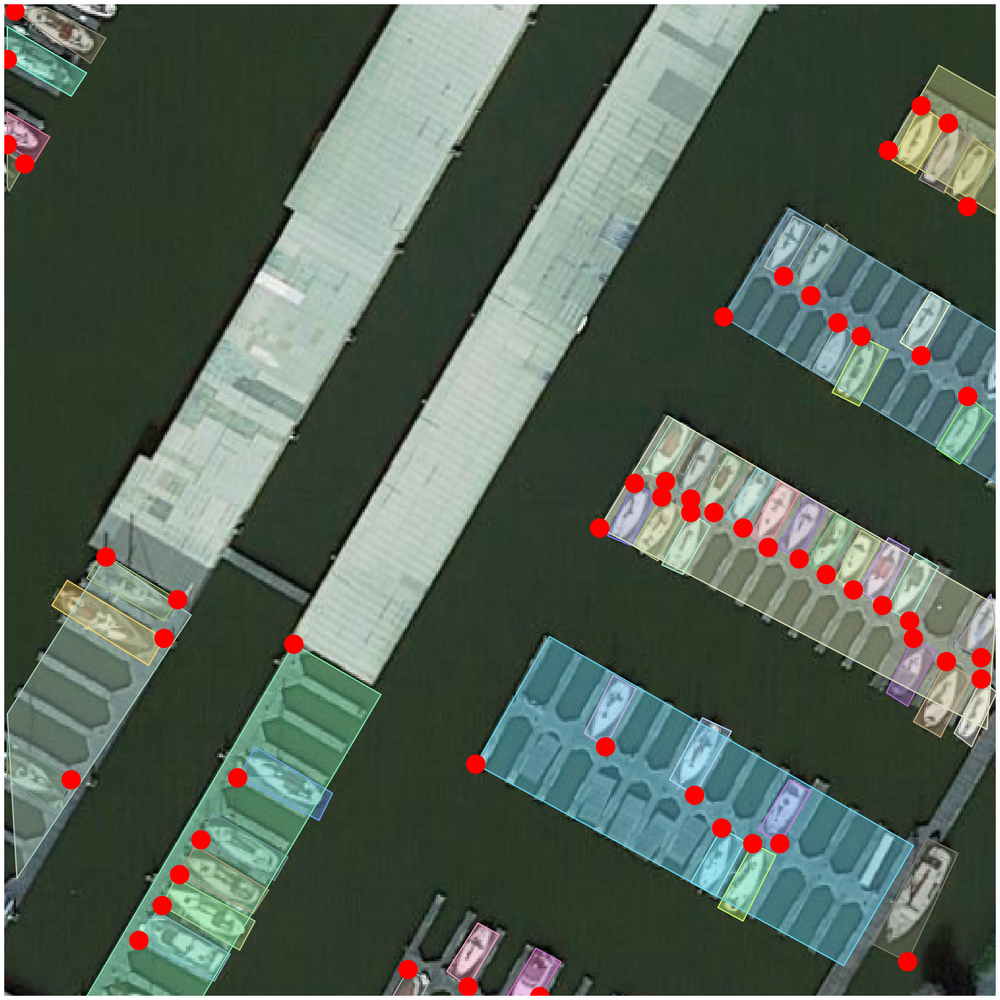

In [11]:
anns = DotaSplit.loadAnns(imgId=imgid)
# print(anns)
DotaSplit.showAnns(anns, imgid, 2)

# Step3: 融合数据
假设这里已经将分割后的数据过了一次前向检测，此时就需要分割了。

## 初始化
其中 Task1 指的是每个类分别存储的四点坐标 

In [9]:
from ResultMerge import mergebypoly
'''
之前已经有了split_path, split_img_root,split_label_root
'''
merge_path = os.path.join(split_path,'merge')
split_Task1_root = os.path.join(split_path,'Task1')
merge_Task1_root = os.path.join(merge_path,'Task1')
merge_label_root = os.path.join(merge_path,'labelTxt')

'''
构造存放路径
'''
if not os.path.exists(merge_path):
    os.mkdir(merge_path)
print('融合数据地址：', merge_path)
if not os.path.exists(split_Task1_root):
    os.mkdir(split_Task1_root)
print('分割数据按类汇总的地址：', split_Task1_root)
if not os.path.exists(merge_Task1_root):
    os.mkdir(merge_Task1_root)
print('融合数据按类汇总的地址：', merge_Task1_root)
if not os.path.exists(merge_label_root):
    os.mkdir(merge_label_root)
print('融合数据标注的地址：', merge_label_root)


融合数据地址： /home/liuchang/data/DOTAsplit/merge
分割数据按类汇总的地址： /home/liuchang/data/DOTAsplit/Task1
融合数据按类汇总的地址： /home/liuchang/data/DOTAsplit/merge/Task1
融合数据标注的地址： /home/liuchang/data/DOTAsplit/merge/labelTxt


In [13]:
'''
非常非常time consuming！建议跳过
'''
util.groundtruth2Task1(split_label_root,
                      split_Task1_root)
mergebypoly(split_Task1_root,
           merge_Task1_root)
util.Task2groundtruth_poly(merge_Task1_root,
                          merge_label_root)

In [14]:
'''
测试一下融合后的结果
'''
imgids = util.GetFileFromThisRootDir(merge_label_root)
imgids = [util.custombasename(x) for x in imgids]
print(len(imgids),type(imgids[0]))
imgids = list(set(imgids)) # 对于imgdis进行去重
print(len(imgids),type(imgids[0]))
print(imgids[0])

'''
建立融合软连接
已经有了merge_path和里面的labelTxt(merge_label_root)，但还没有img
'''
merge_img_root = os.path.join(merge_path,'images')
if not os.path.exists(merge_img_root):
    os.symlink(dota_path + model+'/images', merge_img_root)

'''
merge后dota实例化
'''
DotaMerge = DOTA(merge_path)



456 <class 'str'>
456 <class 'str'>
P1542


加载第 233 张图片: P2462
69
isarralike: False
imgids: ['P2462']
filename: /home/liuchang/data/DOTAsplit/merge/images/P2462.png


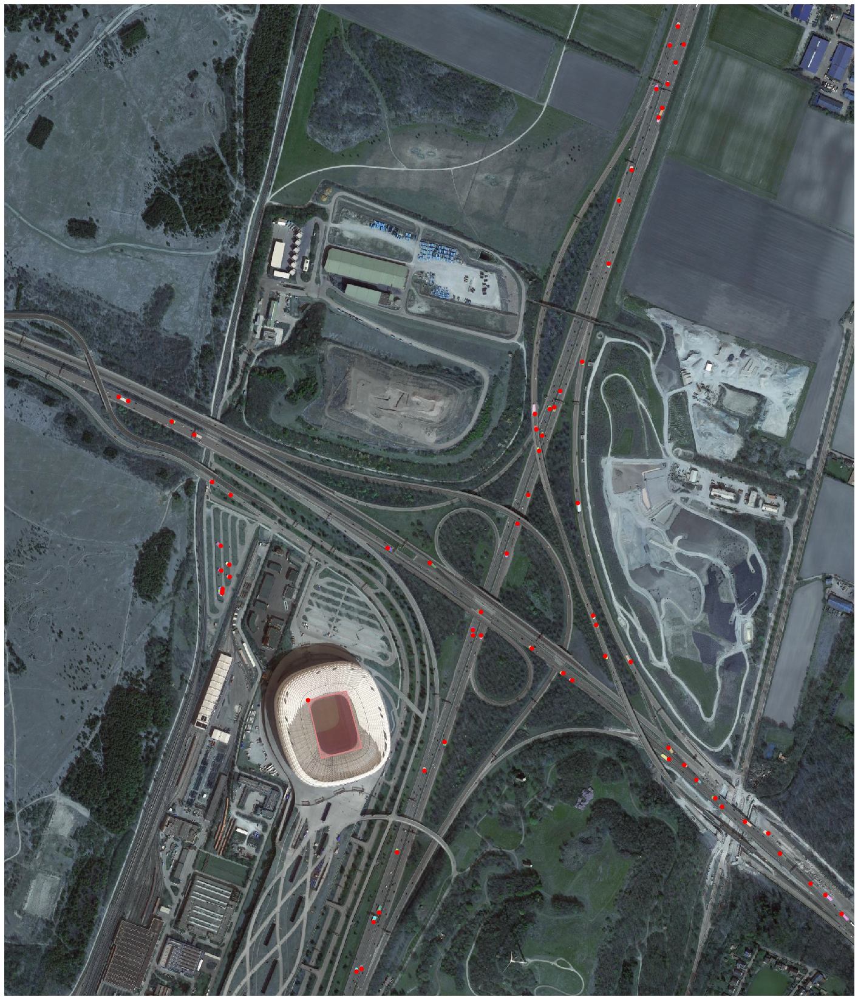

In [15]:
type(DotaMerge)
ID = 233
imgId = imgids[ID]
print('加载第', ID ,'张图片:',imgId )


anns = DotaMerge.loadAnns(imgId=imgId)
print(len(anns))
DotaMerge.showAnns(anns, imgId, 3)


加载第 233 张图片: P2462
69
isarralike: False
imgids: ['P2462']
filename: /home/liuchang/data/DOTA/val/images/P2462.png


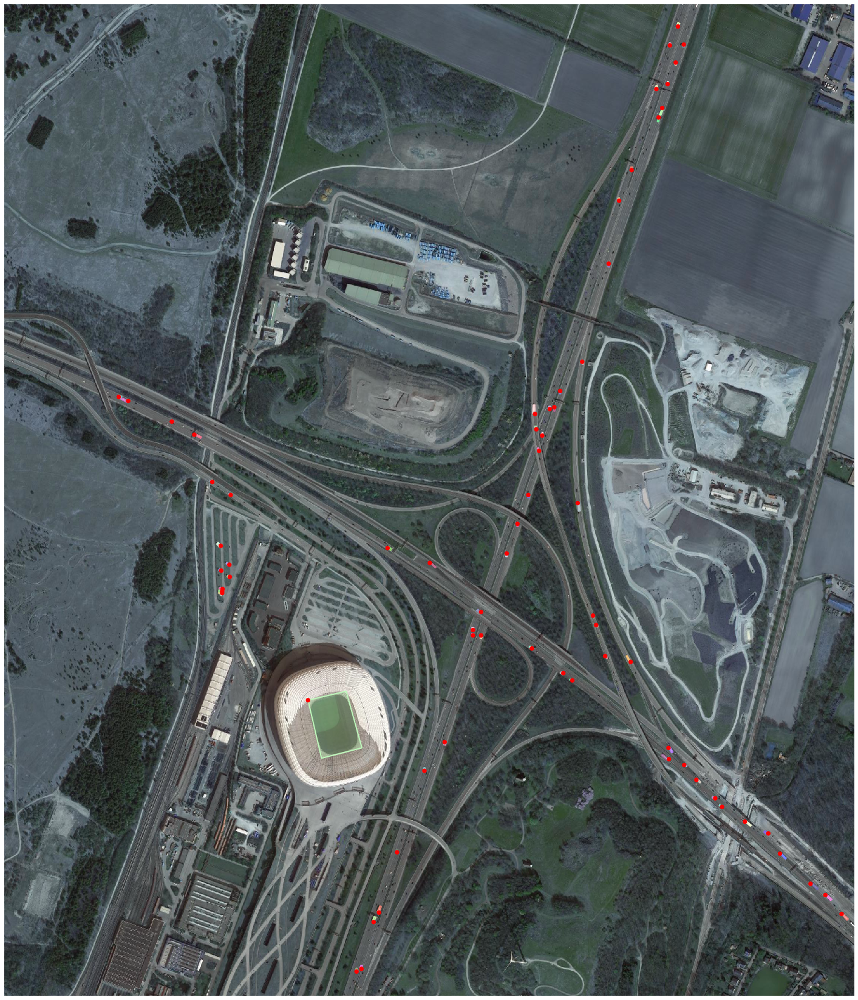

In [16]:
dataset = DOTA(dota_path + model)
ID = 233
imgId = imgids[ID]
print('加载第', ID ,'张图片:',imgId )
anns = dataset.loadAnns(imgId=imgId)
print(len(anns))
dataset.showAnns(anns, imgId, 3)


## EXTRA：cvtools 能直接用就不折腾了……

In [11]:
import cvtools
# convert dota dataset to coco dataset format
# label folder
label_root = split_label_root
# imgage folder
image_root = split_img_root
# what you want to repalece in path string.
# if not, you can ignore this parameter.

'''
x1y1x2y2x3y3x4y4,x1y1wh,x1y1wha
'''
print('x1y1wh')
path_replace = {'\\': '/'}
dota_to_coco = cvtools.DOTA2COCO(label_root,
                                 image_root,
                                 box_form='x1y1wh')

dota_to_coco.convert()

cocopath = '/home/liuchang/data/DOTACOCO/'
coco_img_root = os.path.join(cocopath,'images')
coco_label_root = os.path.join(cocopath,'annotations/')
if not os.path.exists(cocopath):
    os.mkdir(cocopath)
print('DOTA2COCO结果地址：', cocopath)

if not os.path.exists(coco_img_root):
    os.mkdir(coco_img_root)
print('COCO图片存放地址：', coco_img_root)

if not os.path.exists(coco_img_root):
    print('创建软连接……')
    os.symlink(split_img_root,coco_img_root)


if not os.path.exists(coco_label_root):
    os.mkdir(coco_label_root)
print('COCO标注存放地址：', coco_label_root)

labelname = 'instances_train4444.json'

dota_to_coco.save_json(coco_label_root + labelname)

print('x1y1x2y2x3y3x4y4')
path_replace = {'\\': '/'}
dota_to_coco = cvtools.DOTA2COCO(label_root,
                                 image_root,
                                 box_form='x1y1x2y2x3y3x4y4')
dota_to_coco.convert()
labelname = 'instances_train8888.json'
dota_to_coco.save_json(coco_label_root + labelname)

print('x1y1wha')
path_replace = {'\\': '/'}
dota_to_coco = cvtools.DOTA2COCO(label_root,
                                 image_root,
                                 box_form='x1y1wh')
dota_to_coco.convert()
labelname = 'instances_train5555.json'
dota_to_coco.save_json(coco_label_root + labelname)

x1y1wh


100%|██████████| 26484/26484 [00:06<00:00, 3922.00it/s]


DOTA2COCO结果地址： /home/liuchang/data/DOTACOCO/
COCO图片存放地址： /home/liuchang/data/DOTACOCO/images
COCO标注存放地址： /home/liuchang/data/DOTACOCO/annotations/


  0%|          | 0/26484 [00:00<?, ?it/s]

!save /home/liuchang/data/DOTACOCO/annotations/instances_train4444.json finished
x1y1x2y2x3y3x4y4


  0%|          | 0/26484 [00:00<?, ?it/s]

!save /home/liuchang/data/DOTACOCO/annotations/instances_train8888.json finished
x1y1wha


100%|██████████| 26484/26484 [00:04<00:00, 5723.46it/s]


!save /home/liuchang/data/DOTACOCO/annotations/instances_train5555.json finished


In [18]:
import sys
import json

sys.path.append("/home/liuchang/data/cocoapi/PythonAPI")#把cocoapi的绝对路径加上
from pycocotools.coco import COCO

ann_file = coco_label_root + labelname # json文件的绝对路径
coco = COCO(annotation_file=ann_file)

print("coco\nimages.size [%05d]\tannotations.size [%05d]\t category.size [%05d]\ndone!"
      %(len(coco.imgs),len(coco.anns),len(coco.cats)))


loading annotations into memory...
Done (t=1.08s)
creating index...
index created!
coco
images.size [26484]	annotations.size [151703]	 category.size [00016]
done!
